# Inferencia y validación visual

En este notebook se carga el modelo final seleccionado y se realizan pruebas de inferencia sobre imágenes del conjunto de test. El objetivo es visualizar las detecciones realizadas por el modelo y obtener el conteo automático de capítulos de girasol por imagen.

In [29]:
# Importamos librerías necesarias
import pandas as pd
import os
import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

In [4]:
# Definimos las rutas principales del proyecto

project_path = Path.cwd()

unified_dataset_path = project_path / "sunflower_unified"

model_path = project_path / "runs" / "detect" / "sunflower_counting" / "yolov8s_40e_local" / "weights" / "best.pt"

test_images_dir = unified_dataset_path / "test" / "images"

print("Dataset unificado:", unified_dataset_path)
print("Modelo final:", model_path)
print("Imágenes de test:", test_images_dir)

print("Existe dataset:", unified_dataset_path.exists())
print("Existe modelo:", model_path.exists())
print("Existe test images:", test_images_dir.exists())

Dataset unificado: C:\Users\feder\Documents\UBA\10 - Vision por Computadora II\TP\sunflower_unified
Modelo final: C:\Users\feder\Documents\UBA\10 - Vision por Computadora II\TP\runs\detect\sunflower_counting\yolov8s_40e_local\weights\best.pt
Imágenes de test: C:\Users\feder\Documents\UBA\10 - Vision por Computadora II\TP\sunflower_unified\test\images
Existe dataset: True
Existe modelo: True
Existe test images: True


In [5]:
# Cargamos el modelo final seleccionado

model = YOLO(model_path)

print("Modelo cargado correctamente.")

Modelo cargado correctamente.


In [25]:
# Seleccionamos 10 imágenes aleatorias del conjunto de test

test_images = list(test_images_dir.glob("*.jpg")) + \
              list(test_images_dir.glob("*.png"))

selected_images = random.sample(test_images, 10)

print("Imágenes seleccionadas:")

for img in selected_images:
    print(img.name)

Imágenes seleccionadas:
20240206_131856-mp4_frame2_jpg.rf.349d543f02fe31db6bf666835665ba36.jpg
MVI_9977-MP4_frame16_jpg.rf.1cfc59247eba437fac2b5a9f29855650.jpg
MVI_9865-MP4_frame6_jpg.rf.54028ecb4173ba19d05eb3c5f0744a42.jpg
MVI_0005-MP4_frame22_jpg.rf.898516e5e5fa86f0e053f6324911b8f1.jpg
MVI_9987-MP4_frame19_jpg.rf.b4c3fe702db7f55027941cd4bd9b2ab1.jpg
MVI_0004-MP4_frame11_jpg.rf.1c29c5d36a1839bd29e9899ac8a57b3d.jpg
20240116_122814-mp4_frame38_jpg.rf.1553ed3619dfe283a573c2d2ef9f7fec.jpg
20240206_131856-mp4_frame12_jpg.rf.d4be822433afa46439bbe3e0b80d97fb.jpg
MVI_9996-MP4_frame37_jpg.rf.c3dbd99c2b19826064502e8c50ff02ae.jpg
MVI_9979-MP4_frame7_jpg.rf.38d20cc918dced5b5707f873e0443ed6.jpg


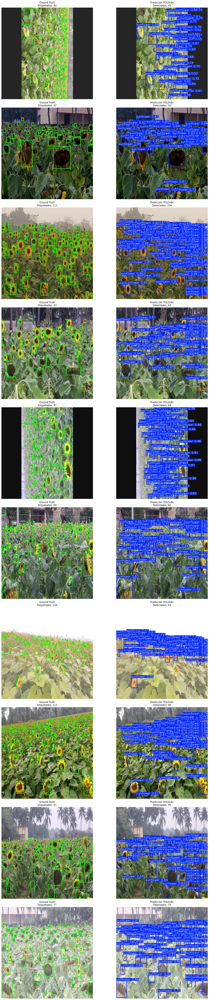

In [31]:
# Comparación Ground Truth vs Predicción para 10 imágenes

summary = []

conf_threshold = 0.50

fig, axes = plt.subplots(10, 2, figsize=(18, 70))

for idx, image_path in enumerate(selected_images):

    # =====================================================
    # Ground Truth
    # =====================================================

    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gt_image = image.copy()

    label_path = (
        unified_dataset_path /
        "test" /
        "labels" /
        f"{image_path.stem}.txt"
    )

    with open(label_path, "r") as file:
        labels = file.readlines()

    img_height, img_width, _ = gt_image.shape

    for label in labels:

        class_id, x_center, y_center, width, height = map(
            float,
            label.split()
        )

        x_center *= img_width
        y_center *= img_height
        width *= img_width
        height *= img_height

        x1 = int(x_center - width / 2)
        y1 = int(y_center - height / 2)
        x2 = int(x_center + width / 2)
        y2 = int(y_center + height / 2)

        cv2.rectangle(
            gt_image,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            2
        )

    num_gt = len(labels)

    # =====================================================
    # Predicción
    # =====================================================

    results = model.predict(
        source=str(image_path),
        conf=conf_threshold,
        verbose=False
    )

    pred_image = results[0].plot()
    pred_image = cv2.cvtColor(pred_image, cv2.COLOR_BGR2RGB)

    num_pred = len(results[0].boxes)

    # =====================================================
    # Guardar resultados para la tabla
    # =====================================================

    summary.append({
        "Imagen": image_path.name,
        "Etiquetados": num_gt,
        "Detectados": num_pred
    })

    # =====================================================
    # Mostrar imágenes
    # =====================================================

    axes[idx, 0].imshow(gt_image)
    axes[idx, 0].axis("off")
    axes[idx, 0].set_title(
        f"Ground Truth\nEtiquetados: {num_gt}"
    )

    axes[idx, 1].imshow(pred_image)
    axes[idx, 1].axis("off")
    axes[idx, 1].set_title(
        f"Predicción YOLOv8s\nDetectados: {num_pred}"
    )

plt.tight_layout()
plt.show()



In [32]:
# =====================================================
# Tabla resumen
# =====================================================

summary_df = pd.DataFrame(summary)

summary_df["Diferencia"] = (
    summary_df["Detectados"] -
    summary_df["Etiquetados"]
)

display(summary_df)

# =====================================================
# Resumen general
# =====================================================

print(
    "Capítulos etiquetados totales:",
    summary_df["Etiquetados"].sum()
)

print(
    "Capítulos detectados totales:",
    summary_df["Detectados"].sum()
)

print(
    "Diferencia total:",
    summary_df["Diferencia"].sum()
)

,Imagen,Etiquetados,Detectados,Diferencia
0,20240206_131856-mp4_frame2_jpg.rf.349d543f02fe...,90,45,-45
1,MVI_9977-MP4_frame16_jpg.rf.1cfc59247eba437fac...,42,50,8
2,MVI_9865-MP4_frame6_jpg.rf.54028ecb4173ba19d05...,112,104,-8
3,MVI_0005-MP4_frame22_jpg.rf.898516e5e5fa86f0e0...,43,43,0
4,MVI_9987-MP4_frame19_jpg.rf.b4c3fe702db7f55027...,97,69,-28
5,MVI_0004-MP4_frame11_jpg.rf.1c29c5d36a1839bd29...,69,60,-9
6,20240116_122814-mp4_frame38_jpg.rf.1553ed3619d...,104,93,-11
7,20240206_131856-mp4_frame12_jpg.rf.d4be822433a...,113,90,-23
8,MVI_9996-MP4_frame37_jpg.rf.c3dbd99c2b19826064...,55,45,-10
9,MVI_9979-MP4_frame7_jpg.rf.38d20cc918dced5b570...,77,73,-4


Capítulos etiquetados totales: 802
Capítulos detectados totales: 672
Diferencia total: -130


### Evaluación sobre imágenes del conjunto de test

Se realizó una validación visual sobre diez imágenes seleccionadas aleatoriamente del conjunto de test utilizando el **modelo YOLOv8s y un umbral de confianza de 0.50**.

En total, las diez imágenes contenían 802 capítulos de girasol etiquetados manualmente, mientras que el modelo detectó 672 objetos, lo que representa aproximadamente el 84% de las anotaciones presentes en el dataset.

Los resultados muestran una buena capacidad de detección en la mayoría de las imágenes evaluadas. En varios casos, la diferencia entre el número de objetos etiquetados y detectados fue reducida, e incluso una de las imágenes presentó coincidencia exacta entre ambos conteos.

Las mayores discrepancias se observaron en escenas con alta densidad de capítulos pequeños o alejados de la cámara. En estos casos, el modelo tiende a omitir algunos objetos debido a la limitada cantidad de información visual disponible, fenómeno habitual en problemas de detección de objetos de pequeño tamaño.

A partir de la inspección visual realizada, se concluye que el modelo **logra identificar correctamente la mayoría de los capítulos visibles** y resulta adecuado para la tarea de detección y conteo automático de capítulos de girasol, aunque presenta **limitaciones en escenarios con gran cantidad de objetos pequeños y parcialmente visibles**.


### Análisis de la matriz de confusión

La matriz de confusión obtenida durante la evaluación del modelo muestra un total de 28.350 verdaderos positivos, 2.907 falsos negativos y 8.423 falsos positivos.

Estos resultados indican que **el modelo logra detectar correctamente** la gran mayoría de los capítulos de girasol presentes en las imágenes. La cantidad relativamente baja de falsos negativos sugiere una buena capacidad de recuperación de objetos, mientras que los falsos positivos pueden estar asociados tanto a errores de detección como a capítulos parcialmente visibles o de pequeño tamaño que no fueron etiquetados en el dataset original.

Este comportamiento coincide con las observaciones realizadas durante la inspección visual, donde se verificó que el modelo detecta correctamente la mayoría de los capítulos visibles, aunque presenta dificultades en escenas con alta densidad de objetos pequeños o lejanos.


![Matriz de confusión](runs/detect/sunflower_counting/yolov8s_40e_local/confusion_matrix.png)